<a href="https://colab.research.google.com/github/ibonetc/AI_Deep-Learning/blob/main/DeepLearning/IA_DL_Ejemplo2_GatosPerros_DataGenerator.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Ejemplo usando Keras con la base de datos de perros y gatos

Enlace de datos:
[Descargue la base de datos aquí](https://www.kaggle.com/c/dogs-vs-cats-redux-kernels-edition/data)

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
from sklearn.datasets import load_files
import numpy as np
import matplotlib.pyplot as plt
import random
import cv2
import seaborn as sns
import glob

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dropout, Flatten, Conv2D,MaxPooling2D, Dense, Activation
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.callbacks import ModelCheckpoint, Callback, EarlyStopping
from keras.utils import np_utils
import os

## Cargando archivos desde Drive

Como el fichero está comprimido con .zip, se ejecuta la siguiente instrucción para descomprimirlo

In [3]:
!unzip "/content/drive/MyDrive/Datos_AD/Gatos_Perros.zip"

Archive:  /content/drive/MyDrive/Datos_AD/Gatos_Perros.zip
  inflating: sample_submission.csv   
  inflating: test.zip                
  inflating: train.zip               


In [ ]:
!unzip "/content/train.zip"

In [ ]:
glob.glob('/content/train/*.jpg')

In [5]:
fnames_train = np.array(glob.glob('/content/train/*.jpg'))
labels_train = np.array([(0 if 'cat' in fname else 1) for fname in fnames_train])

In [6]:
fnames_train

array(['/content/train/cat.9328.jpg', '/content/train/cat.6714.jpg',
       '/content/train/cat.10985.jpg', ..., '/content/train/cat.494.jpg',
       '/content/train/dog.2909.jpg', '/content/train/dog.1866.jpg'],
      dtype='<U28')

In [7]:
labels_train

array([0, 0, 0, ..., 0, 1, 1])

In [8]:
np.unique(labels_train,return_counts=True)

(array([0, 1]), array([12500, 12500]))

In [13]:
labels_train_categorical = np.array([('cat' if 'cat' in fname else 'dog') for fname in fnames_train])

Text(0.5, 1.0, 'Gatos y Perros')

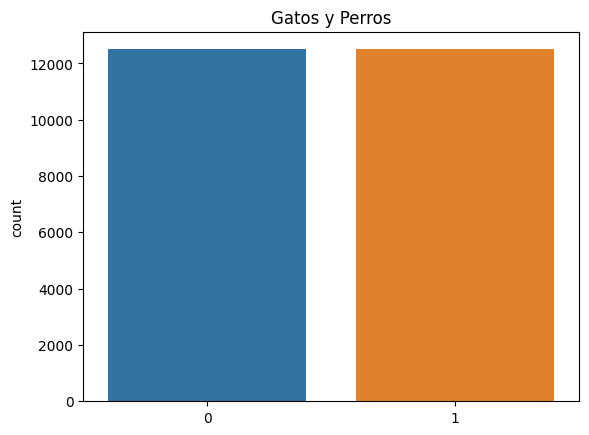

In [19]:
sns.countplot(x=labels_train)
plt.title('Gatos y Perros')

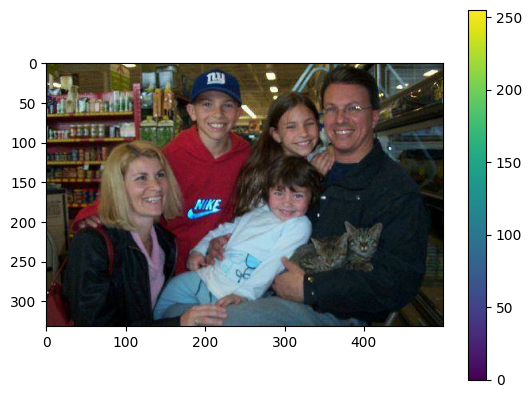

In [25]:
img = plt.imread(fnames_train[28])
plt.imshow(img)
plt.grid(False)
plt.colorbar()

In [29]:
img.shape

(332, 500, 3)

In [32]:
img[0]

array([[44, 46,  9],
       [47, 49, 12],
       [59, 61, 24],
       ...,
       [53, 59, 57],
       [52, 58, 56],
       [51, 57, 55]], dtype=uint8)

## Creando el conjunto de entrenamiento y prueba
* Necesitamos cargar las imágenes.
* Reescalarlas, porque no tienen el mimo tamaño, por ejemplo acá vamos a ponerlas de 64x64 y con canal 3

### Cargando datos manualmente (Esta opción puede llenar la RAM)

In [ ]:
def read_image(file_path, ROWS = 64,COLS = 64):
  img = cv2.imread(file_path, cv2.IMREAD_COLOR)
  return cv2.resize(img, (ROWS, COLS))

In [ ]:
def prep_data(images, ROWS = 64,COLS = 64,CHANNELS=3):
  count = len(images)
  data = np.ndarray((count, ROWS, COLS, CHANNELS))
  for i, image_file in enumerate(images):
    image = read_image(image_file,ROWS,COLS)
    data[i] = image
  return data

In [ ]:
ROWS = 64
COLS = 64
CHANNELS = 3
#train = prep_data(fnames_train,ROWS=ROWS,COLS=COLS)

In [ ]:
#train.shape

(25000, 64, 64, 3)

In [ ]:
#train=train/255.0

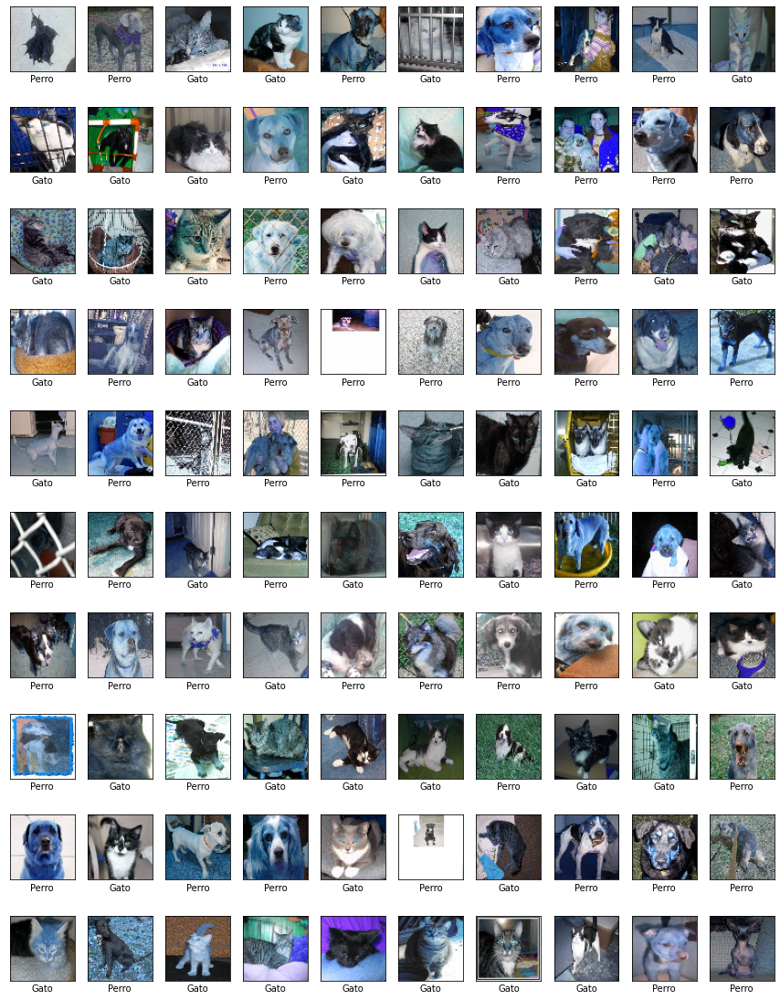

In [ ]:
plt.figure(figsize=(15,20))
for i in range(100):
    plt.subplot(10,10,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(train[i])
    plt.xlabel('Gato' if labels_train[i]==0 else 'Perro')
plt.show()

### Cargando los datos con ImageDataGenerator

Para cargar los datos con ImageDataGenerator necesitamos tener o los datos separados por carpetas o un Dataframe



In [33]:
import pandas as pd

In [34]:
labels = np.array([('cat' if 'cat' in fname else 'dog') for fname in fnames_train])

In [35]:
labels

array(['cat', 'cat', 'cat', ..., 'cat', 'dog', 'dog'], dtype='<U3')

In [36]:
df=pd.DataFrame({'images':fnames_train, 'class':labels})
df

,images,class
0,/content/train/cat.9328.jpg,cat
1,/content/train/cat.6714.jpg,cat
2,/content/train/cat.10985.jpg,cat
3,/content/train/cat.9433.jpg,cat
4,/content/train/cat.1583.jpg,cat
...,...,...
24995,/content/train/cat.11750.jpg,cat
24996,/content/train/dog.1517.jpg,dog
24997,/content/train/cat.494.jpg,cat
24998,/content/train/dog.2909.jpg,dog


In [37]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [38]:
datagen=ImageDataGenerator(rescale=1./255.,validation_split=0.25)

In [39]:
train_generator=datagen.flow_from_dataframe(
dataframe=df,
x_col="images",
y_col="class",
subset="training",
batch_size=64,
seed=5,
shuffle=True,
class_mode='binary',
target_size=(64,64))

Found 18750 validated image filenames belonging to 2 classes.


In [40]:
validation_generator=datagen.flow_from_dataframe(
dataframe=df,
x_col="images",
y_col="class",
subset="validation",
batch_size=64,
seed=5,
shuffle=False,
class_mode='binary',
target_size=(64,64))

Found 6250 validated image filenames belonging to 2 classes.


## Creando modelo
Definamos el siguiente modelo de red neuronal:

In [ ]:
classifier = Sequential()
classifier.add(Conv2D(32, (3, 3), input_shape = (64, 64, 3), activation = 'relu'))
classifier.add(MaxPooling2D(pool_size = (2, 2)))

classifier.add(Conv2D(32, (3, 3), activation = 'relu'))
classifier.add(MaxPooling2D(pool_size = (2, 2)))

classifier.add(Flatten())

classifier.add(Dense(units = 128, activation = 'relu'))
classifier.add(Dense(units = 1, activation = 'sigmoid'))

In [66]:
classifier = Sequential()

classifier.add(Conv2D(64, (3, 3), input_shape = (64, 64, 3), activation = 'relu'))
classifier.add(Conv2D(64, (3, 3), activation = 'relu'))
classifier.add(MaxPooling2D(pool_size = (2, 2)))

classifier.add(Conv2D(32, (3, 3), activation = 'relu'))
classifier.add(Conv2D(32, (3, 3), activation = 'relu'))
classifier.add(MaxPooling2D(pool_size = (2, 2)))

classifier.add(Flatten())

classifier.add(Dense(units = 128, activation = 'relu'))
classifier.add(Dropout(0.2))
classifier.add(Dense(units = 1, activation = 'sigmoid'))

In [67]:
classifier.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

In [68]:
epochs=10
history = classifier.fit(train_generator,epochs = epochs,validation_data = validation_generator)

Epoch 1/10
293/293 [==============================] - 42s 136ms/step - loss: 0.6483 - accuracy: 0.6100 - val_loss: 0.6003 - val_accuracy: 0.6784
Epoch 2/10
293/293 [==============================] - 36s 122ms/step - loss: 0.5633 - accuracy: 0.7123 - val_loss: 0.5283 - val_accuracy: 0.7419
Epoch 3/10
293/293 [==============================] - 35s 119ms/step - loss: 0.4950 - accuracy: 0.7578 - val_loss: 0.5900 - val_accuracy: 0.7042
Epoch 4/10
293/293 [==============================] - 39s 134ms/step - loss: 0.4299 - accuracy: 0.8042 - val_loss: 0.4414 - val_accuracy: 0.7965
Epoch 5/10
293/293 [==============================] - 36s 122ms/step - loss: 0.3699 - accuracy: 0.8325 - val_loss: 0.4355 - val_accuracy: 0.7994
Epoch 6/10
293/293 [==============================] - 36s 122ms/step - loss: 0.3113 - accuracy: 0.8640 - val_loss: 0.4454 - val_accuracy: 0.8037
Epoch 7/10
293/293 [==============================] - 39s 133ms/step - loss: 0.2443 - accuracy: 0.8974 - val_loss: 0.4989 - val_ac

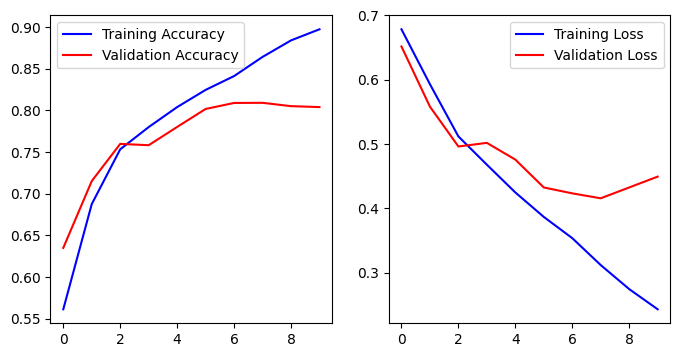

In [64]:
acc=history.history['accuracy']
val_acc=history.history['val_accuracy']
epoch=range(len(acc))
loss=history.history['loss']
val_loss=history.history['val_loss']
f,ax=plt.subplots(1,2,figsize=(8,4))
ax[0].plot(epoch,acc,'blue',label='Training Accuracy')
ax[0].plot(epoch,val_acc,'red',label='Validation Accuracy')
ax[0].legend()
ax[1].plot(epoch,loss,'blue',label='Training Loss')
ax[1].plot(epoch,val_loss,'red',label='Validation Loss')
ax[1].legend()
plt.show()

In [45]:
predictions=classifier.predict(validation_generator)

98/98 [==============================] - 8s 80ms/step


In [46]:
predictions

array([[1.5773868e-02],
       [7.9637626e-04],
       [4.9189016e-01],
       ...,
       [9.9875438e-01],
       [9.1543454e-01],
       [9.7569531e-01]], dtype=float32)

In [47]:
predictions[0]

array([0.01577387], dtype=float32)

In [49]:
predictions_label=[0 if p<0.5 else 1 for p in predictions]

In [52]:
print(predictions_label)

[0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 

In [48]:
train_generator.class_indices

{'cat': 0, 'dog': 1}

Para acceder a los labels del conjunto de validación

In [51]:
labels_test=validation_generator.labels
print(labels_test)

[0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 

In [53]:
data_val=validation_generator.filepaths

Text(0.5, 0, 'Perro  1 (Perro)')

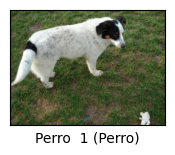

In [54]:
index_image=10
plt.figure(figsize=(2,2))
plt.grid(False)
plt.xticks([])
plt.yticks([])
im=plt.imread(data_val[index_image])
plt.imshow(im)

predicted_label = "Gato" if predictions[index_image][0]<0.5 else "Perro"
real_label="Gato" if labels_test[index_image]==0 else "Perro"
plt.xlabel("{} {:2.0f} ({})".format(predicted_label,
                              predictions[index_image][0],
                              real_label))

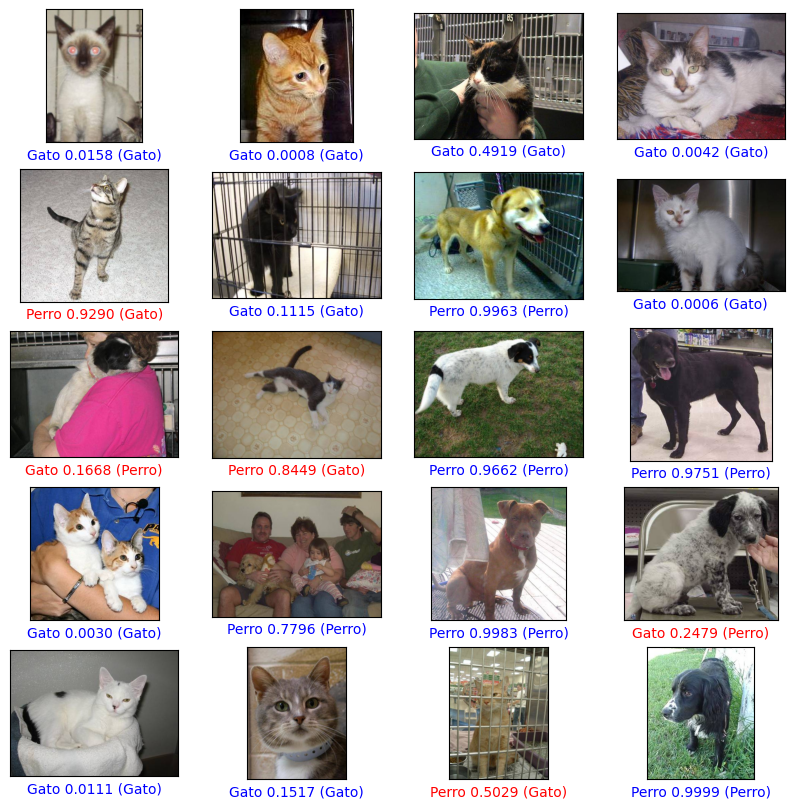

In [55]:
plt.figure(figsize=(10,10))
for index_image in range(20):
  plt.subplot(5, 4, index_image+1)
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])
  im=plt.imread(data_val[index_image])
  plt.imshow(im)

  predicted_label = "Gato" if predictions[index_image][0]<0.5 else "Perro"
  real_label="Gato" if labels_test[index_image]==0 else "Perro"
  color= 'blue' if predicted_label == real_label else 'red'
  plt.xlabel("{} {:2.0f} ({})".format(predicted_label,
                                predictions[index_image][0],
                                real_label))
  plt.xlabel(f'{predicted_label} {np.max(predictions[index_image][0]):.4f} ({real_label})', color=color)

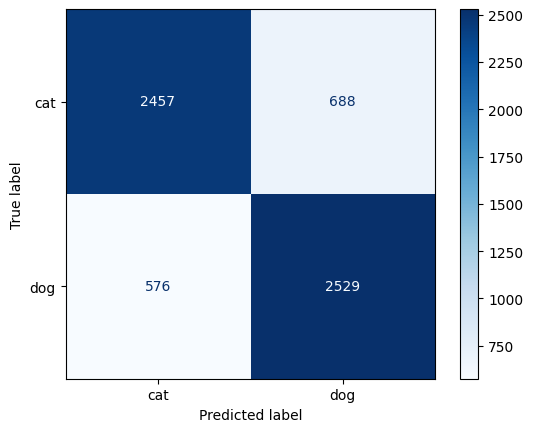

In [56]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(labels_test, predictions_label)
cm
train_generator.class_indices
classes=list(train_generator.class_indices.keys())

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
disp.plot(cmap=plt.cm.Blues)

In [57]:
accuracy = np.trace(cm) / float(np.sum(cm))
error = 1 - accuracy
print(accuracy, error)


0.79776 0.20223999999999998


In [58]:
from sklearn.metrics import classification_report

In [59]:
print(classification_report(labels_test, predictions_label, target_names=classes))

              precision    recall  f1-score   support

         cat       0.81      0.78      0.80      3145
         dog       0.79      0.81      0.80      3105

    accuracy                           0.80      6250
   macro avg       0.80      0.80      0.80      6250
weighted avg       0.80      0.80      0.80      6250



## Un modelo más complejo

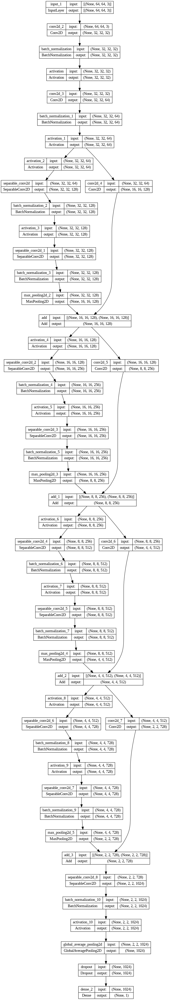

In [ ]:
#input_shape=train.shape[1:4]
num_classes=2

inputs = keras.Input(shape=(64,64,3))

x = layers.Conv2D(32, 3, strides=2, padding="same")(inputs)
x = layers.BatchNormalization()(x)
x = layers.Activation("relu")(x)

x = layers.Conv2D(64, 3, padding="same")(x)
x = layers.BatchNormalization()(x)
x = layers.Activation("relu")(x)

previous_block_activation = x

for size in [128, 256, 512, 728]:
  x = layers.Activation("relu")(x)
  x = layers.SeparableConv2D(size, 3, padding="same")(x)
  x = layers.BatchNormalization()(x)

  x = layers.Activation("relu")(x)
  x = layers.SeparableConv2D(size, 3, padding="same")(x)
  x = layers.BatchNormalization()(x)

  x = layers.MaxPooling2D(3, strides=2, padding="same")(x)

  residual = layers.Conv2D(size, 1, strides=2, padding="same")(previous_block_activation)
  x = layers.add([x, residual])  # Add back residual
  previous_block_activation = x  # Set aside next residual

x = layers.SeparableConv2D(1024, 3, padding="same")(x)
x = layers.BatchNormalization()(x)
x = layers.Activation("relu")(x)

x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.5)(x)

outputs = layers.Dense(1, activation="sigmoid")(x)
model= keras.Model(inputs, outputs)

keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.compile(
    optimizer=keras.optimizers.Adam(1e-3),
    loss="binary_crossentropy",
    metrics=["accuracy"]
)



```
tf.keras.callbacks.ModelCheckpoint(
    filepath,
    monitor: str = "val_loss",
    verbose: int = 0,
    save_best_only: bool = False,
    save_weights_only: bool = False,
    mode: str = "auto",
    save_freq="epoch",
    options=None,
    initial_value_threshold=None,
    **kwargs
)
```



In [ ]:
callbacks = [keras.callbacks.ModelCheckpoint("save_last_model.h5")]
history=model.fit(train_generator, epochs=20, callbacks=callbacks, validation_data=validation_generator)

Epoch 1/20
293/293 [==============================] - 90s 265ms/step - loss: 0.5860 - accuracy: 0.6935 - val_loss: 0.9745 - val_accuracy: 0.4968
Epoch 2/20
293/293 [==============================] - 75s 256ms/step - loss: 0.4393 - accuracy: 0.7996 - val_loss: 0.5427 - val_accuracy: 0.7178
Epoch 3/20
293/293 [==============================] - 79s 270ms/step - loss: 0.3494 - accuracy: 0.8463 - val_loss: 0.4136 - val_accuracy: 0.8198
Epoch 4/20
293/293 [==============================] - 75s 257ms/step - loss: 0.2835 - accuracy: 0.8778 - val_loss: 0.5838 - val_accuracy: 0.7554
Epoch 5/20
293/293 [==============================] - 76s 261ms/step - loss: 0.2283 - accuracy: 0.9046 - val_loss: 0.7337 - val_accuracy: 0.7600
Epoch 6/20
293/293 [==============================] - 75s 257ms/step - loss: 0.1819 - accuracy: 0.9252 - val_loss: 0.4548 - val_accuracy: 0.8298
Epoch 7/20
293/293 [==============================] - 79s 268ms/step - loss: 0.1427 - accuracy: 0.9430 - val_loss: 0.4759 - val_ac

In [ ]:
model.evaluate(validation_generator)

98/98 [==============================] - 18s 186ms/step - loss: 0.8000 - accuracy: 0.8179


[0.7999601364135742, 0.8179200291633606]

In [ ]:
newModel=tf.keras.models.load_model('/content/save_last_model.h5')

In [ ]:
newModel.evaluate(validation_generator)

98/98 [==============================] - 19s 188ms/step - loss: 0.8000 - accuracy: 0.8179


[0.7999601364135742, 0.8179200291633606]

## Transferencia de aprendizaje (usando otras redes entrenadas)

Lo mejor para cargar los datos es cargarlo por batch, pero para esto deben estar separadas en carpetas, que no es este caso.

Para separar las imágenes en carpetas con el nombre de las clases, vamos a crear carpetas y dividirlas

In [69]:
from os import makedirs
from os import listdir
from shutil import copyfile
from random import seed
from random import random
from tensorflow.keras.preprocessing.image import ImageDataGenerator

Otra opción para separar los datos

In [ ]:
dataset_home = '/content/dataset_dogs_vs_cats/'

labeldirs = ['dogs/', 'cats/']
for labldir in labeldirs:
	newdir = dataset_home + labldir
	makedirs(newdir, exist_ok=True)

src_directory = '/content/train'
for file in listdir(src_directory):
	src = src_directory + '/' + file
	if file.startswith('cat'):
		dst = dataset_home + 'cats/'  + file
		copyfile(src, dst)
	elif file.startswith('dog'):
		dst = dataset_home + 'dogs/'  + file
		copyfile(src, dst)

Para poder dividirlo en entrenamiento y validación, vamos a pasarlos con un aleatorio

In [70]:
dataset_home = '/content/data_dogs_vs_cats/'
subdirs = ['train/', 'test/']
for subdir in subdirs:
	labeldirs = ['dogs/', 'cats/']
	for labldir in labeldirs:
		newdir = dataset_home + subdir + labldir
		makedirs(newdir, exist_ok=True)

seed(1)

val_ratio = 0.2
src_directory = '/content/train'
for file in listdir(src_directory):
	src = src_directory + '/' + file
	dst_dir = 'train/'
	if random() < val_ratio:
		dst_dir = 'test/'
	if file.startswith('cat'):
		dst = dataset_home + dst_dir + 'cats/'  + file
		copyfile(src, dst)
	elif file.startswith('dog'):
		dst = dataset_home + dst_dir + 'dogs/'  + file
		copyfile(src, dst)

In [71]:
datagen = ImageDataGenerator(rescale=1.0/255.0)

In [72]:
batch_size=32
train_it = datagen.flow_from_directory('/content/data_dogs_vs_cats/train', class_mode='binary', batch_size=batch_size, target_size=(224, 224))
test_it = datagen.flow_from_directory('/content/data_dogs_vs_cats/test', class_mode='binary', batch_size=batch_size, target_size=(224, 224),shuffle=False)

Found 19910 images belonging to 2 classes.
Found 5090 images belonging to 2 classes.


In [73]:
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split

In [74]:
base_modelResNet50=ResNet50(pooling='max', weights='imagenet')

102967424/102967424 [==============================] - 5s 0us/step


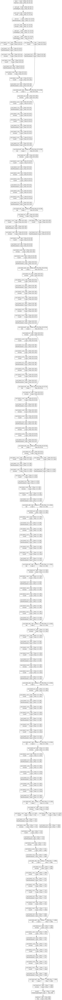

In [ ]:
keras.utils.plot_model(base_modelResNet50, show_shapes=True)

In [ ]:
base_modelResNet50.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [14]:
base_model=ResNet50(include_top=False, pooling='max', weights='imagenet')

94765736/94765736 [==============================] - 5s 0us/step


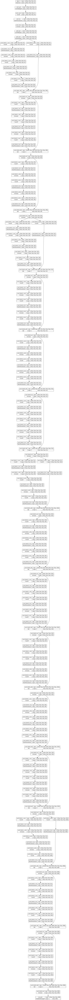

In [ ]:
keras.utils.plot_model(base_model, show_shapes=True)

In [ ]:
base_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, None, None,   0           ['input_2[0][0]']                
                                3)                                                                
                                                                                                  
 conv1_conv (Conv2D)            (None, None, None,   9472        ['conv1_pad[0][0]']              
                                64)                                                        

In [75]:
base_model=ResNet50(include_top=False, pooling='max', weights='imagenet')
for layer in base_model.layers:
  layer.trainable = False
x = base_model.output
x = Dense(128, activation='relu')(x)
predictions = Dense(1, activation="sigmoid")(x)
model = Model(inputs=base_model.input, outputs=predictions)
model.compile(
    optimizer=keras.optimizers.Adam(1e-3),
    loss="binary_crossentropy",
    metrics=["accuracy"]
)

94765736/94765736 [==============================] - 5s 0us/step


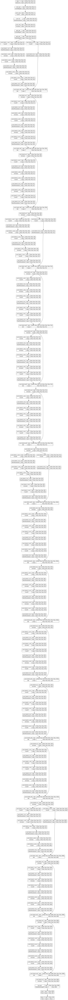

In [16]:
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, None, None,   0           ['input_4[0][0]']                
                                3)                                                                
                                                                                                  
 conv1_conv (Conv2D)            (None, None, None,   9472        ['conv1_pad[0][0]']              
                                64)                                                         

In [76]:
epochs=10
history = model.fit(train_it, steps_per_epoch=len(train_it),
                              validation_data=test_it, validation_steps=len(test_it),
                              epochs=epochs, verbose=1)

Epoch 1/10
623/623 [==============================] - 95s 144ms/step - loss: 0.6877 - accuracy: 0.6171 - val_loss: 0.6739 - val_accuracy: 0.6149
Epoch 2/10
623/623 [==============================] - 89s 142ms/step - loss: 0.6065 - accuracy: 0.6659 - val_loss: 0.5869 - val_accuracy: 0.6980
Epoch 3/10
623/623 [==============================] - 84s 134ms/step - loss: 0.5944 - accuracy: 0.6816 - val_loss: 0.6079 - val_accuracy: 0.6662
Epoch 4/10
623/623 [==============================] - 85s 136ms/step - loss: 0.5836 - accuracy: 0.6906 - val_loss: 0.6738 - val_accuracy: 0.6090
Epoch 5/10
623/623 [==============================] - 85s 136ms/step - loss: 0.5798 - accuracy: 0.6923 - val_loss: 0.5684 - val_accuracy: 0.7057
Epoch 6/10
623/623 [==============================] - 88s 141ms/step - loss: 0.5774 - accuracy: 0.6944 - val_loss: 0.6025 - val_accuracy: 0.6717
Epoch 7/10
623/623 [==============================] - 84s 135ms/step - loss: 0.5728 - accuracy: 0.7002 - val_loss: 0.5799 - val_ac

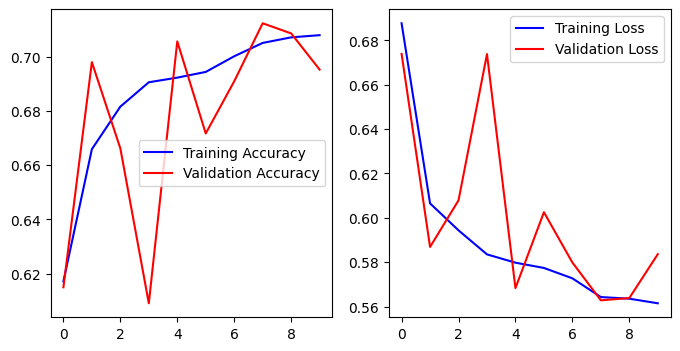

In [77]:
acc=history.history['accuracy']
val_acc=history.history['val_accuracy']
epoch=range(len(acc))
loss=history.history['loss']
val_loss=history.history['val_loss']
f,ax=plt.subplots(1,2,figsize=(8,4))
ax[0].plot(epoch,acc,'blue',label='Training Accuracy')
ax[0].plot(epoch,val_acc,'red',label='Validation Accuracy')
ax[0].legend()
ax[1].plot(epoch,loss,'blue',label='Training Loss')
ax[1].plot(epoch,val_loss,'red',label='Validation Loss')
ax[1].legend()
plt.show()

In [78]:
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.optimizers import SGD

In [20]:
model = VGG16()
model.summary()

553467096/553467096 [==============================] - 25s 0us/step
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                           

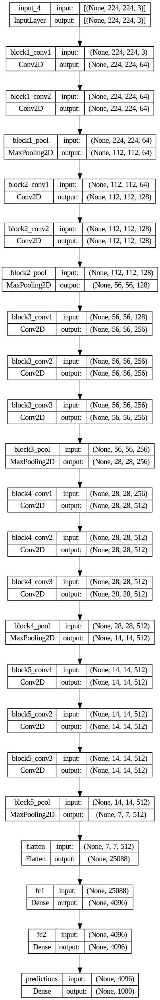

In [21]:
keras.utils.plot_model(model, show_shapes=True)

In [22]:
model = VGG16(include_top=False, input_shape=(224, 224, 3))
model.summary()

58889256/58889256 [==============================] - 3s 0us/step
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                              

In [23]:
model = VGG16(include_top=False, input_shape=(224, 224, 3))
for layer in model.layers:
  layer.trainable = False
x = Flatten()(model.output)
x = Dense(128, activation='relu', kernel_initializer='he_uniform')(x)
output = Dense(1, activation='sigmoid')(x)

model = Model(inputs=model.inputs, outputs=output)

opt = SGD(lr=0.001, momentum=0.9)
model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])

In [25]:
epochs=20
history = model.fit(train_it, steps_per_epoch=len(train_it),
                              validation_data=test_it, validation_steps=len(test_it),
                              epochs=epochs, verbose=1)

Epoch 1/20
623/623 [==============================] - 129s 207ms/step - loss: 0.2295 - accuracy: 0.9070 - val_loss: 0.1963 - val_accuracy: 0.9250
Epoch 2/20
623/623 [==============================] - 109s 175ms/step - loss: 0.1900 - accuracy: 0.9264 - val_loss: 0.2037 - val_accuracy: 0.9194
Epoch 3/20
623/623 [==============================] - 109s 175ms/step - loss: 0.1853 - accuracy: 0.9278 - val_loss: 0.1854 - val_accuracy: 0.9251
Epoch 4/20
623/623 [==============================] - 128s 206ms/step - loss: 0.1652 - accuracy: 0.9343 - val_loss: 0.2181 - val_accuracy: 0.9181
Epoch 5/20
623/623 [==============================] - 109s 175ms/step - loss: 0.1781 - accuracy: 0.9318 - val_loss: 0.1835 - val_accuracy: 0.9291
Epoch 6/20
623/623 [==============================] - 128s 206ms/step - loss: 0.1410 - accuracy: 0.9452 - val_loss: 0.1687 - val_accuracy: 0.9326
Epoch 7/20
623/623 [==============================] - 109s 175ms/step - loss: 0.1393 - accuracy: 0.9465 - val_loss: 0.1798 -

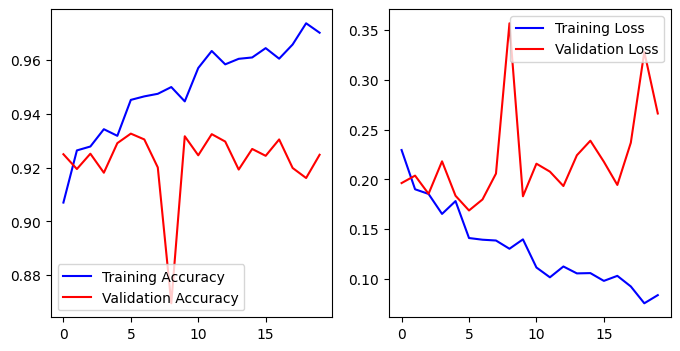

In [26]:
acc=history.history['accuracy']
val_acc=history.history['val_accuracy']
epoch=range(len(acc))
loss=history.history['loss']
val_loss=history.history['val_loss']
f,ax=plt.subplots(1,2,figsize=(8,4))
ax[0].plot(epoch,acc,'blue',label='Training Accuracy')
ax[0].plot(epoch,val_acc,'red',label='Validation Accuracy')
ax[0].legend()
ax[1].plot(epoch,loss,'blue',label='Training Loss')
ax[1].plot(epoch,val_loss,'red',label='Validation Loss')
ax[1].legend()
plt.show()

In [27]:
model.save('/content/drive/My Drive/Datos/dogcatsmodels_vgg16.h5')

In [28]:
model2=keras.models.load_model('/content/drive/My Drive/Datos/dogcatsmodels_vgg16.h5')

In [31]:
model.evaluate(test_it)

160/160 [==============================] - 23s 143ms/step - loss: 0.2662 - accuracy: 0.9248


[0.2661871016025543, 0.9247544407844543]

In [30]:
model2.evaluate(test_it)

160/160 [==============================] - 24s 146ms/step - loss: 0.2662 - accuracy: 0.9248


[0.2661871016025543, 0.9247544407844543]

In [ ]:
## Para una sola imagen
def load_image(filename):
  img = image.load_img(filename, target_size=(224, 224))
  img = image.img_to_array(img)
  img = img.reshape(224, 224, 3)
  img = img.astype('float32')
  return img

In [32]:
Y_pred = model.predict(test_it)

160/160 [==============================] - 23s 141ms/step


In [34]:
train_it.class_indices

{'cats': 0, 'dogs': 1}

In [35]:
Y_pred

array([[4.8924278e-04],
       [1.4091023e-07],
       [6.2384274e-08],
       ...,
       [9.9228644e-01],
       [9.9228644e-01],
       [9.9228644e-01]], dtype=float32)

In [36]:
predictions_label=[(0 if element<0.5 else 1) for element in Y_pred]

In [ ]:
predictions_label

In [39]:
labels_test=test_it.labels

In [ ]:
test_it.class_indices

{'cats': 0, 'dogs': 1}

In [40]:
labels_test

array([0, 0, 0, ..., 1, 1, 1], dtype=int32)

In [42]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(labels_test, predictions_label)
cm

array([[2480,  101],
       [ 282, 2227]])

In [43]:
train_it.class_indices

{'cats': 0, 'dogs': 1}

In [44]:
classes=list(train_it.class_indices.keys())

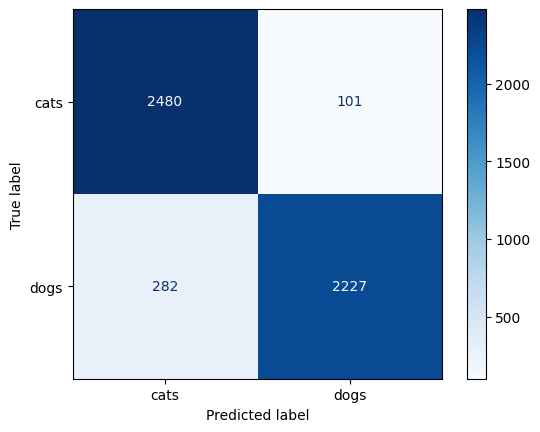

In [45]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
disp.plot(cmap=plt.cm.Blues)

In [46]:
from sklearn.metrics import classification_report
print(classification_report(labels_test, predictions_label, target_names=classes))

              precision    recall  f1-score   support

        cats       0.90      0.96      0.93      2581
        dogs       0.96      0.89      0.92      2509

    accuracy                           0.92      5090
   macro avg       0.93      0.92      0.92      5090
weighted avg       0.93      0.92      0.92      5090



In [79]:
from tensorflow.keras.applications.vgg19 import VGG19

In [ ]:
model = VGG19(include_top=False, input_shape=(224, 224, 3))
for layer in model.layers:
  layer.trainable = False
x = Flatten()(model.output)
x = Dense(128, activation='relu', kernel_initializer='he_uniform')(x)
output = Dense(1, activation='sigmoid')(x)

model = Model(inputs=model.inputs, outputs=output)

opt = SGD(learning_rate=0.001, momentum=0.9)
model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])

80134624/80134624 [==============================] - 0s 0us/step


In [ ]:
history = model.fit(train_it, steps_per_epoch=len(train_it),
                              validation_data=test_it, validation_steps=len(test_it),
                              epochs=10, verbose=1)

Epoch 1/10
623/623 [==============================] - 152s 243ms/step - loss: 0.3443 - accuracy: 0.8405 - val_loss: 0.3500 - val_accuracy: 0.8356
Epoch 2/10
623/623 [==============================] - 150s 240ms/step - loss: 0.2451 - accuracy: 0.8944 - val_loss: 0.2017 - val_accuracy: 0.9143
Epoch 3/10
623/623 [==============================] - 149s 239ms/step - loss: 0.2108 - accuracy: 0.9121 - val_loss: 0.2414 - val_accuracy: 0.8925
Epoch 4/10
623/623 [==============================] - 149s 239ms/step - loss: 0.2021 - accuracy: 0.9158 - val_loss: 0.2063 - val_accuracy: 0.9112
Epoch 5/10
623/623 [==============================] - 149s 239ms/step - loss: 0.1929 - accuracy: 0.9191 - val_loss: 0.2084 - val_accuracy: 0.9116
Epoch 6/10
623/623 [==============================] - 149s 239ms/step - loss: 0.1806 - accuracy: 0.9231 - val_loss: 0.1873 - val_accuracy: 0.9232
Epoch 7/10
623/623 [==============================] - 149s 239ms/step - loss: 0.1749 - accuracy: 0.9268 - val_loss: 0.2012 -

In [ ]:
Y_pred = model.predict(test_it)

160/160 [==============================] - 30s 188ms/step


In [ ]:
model.evaluate(test_it)

160/160 [==============================] - 31s 191ms/step - loss: 0.1684 - accuracy: 0.9310


[0.16839170455932617, 0.9310412406921387]

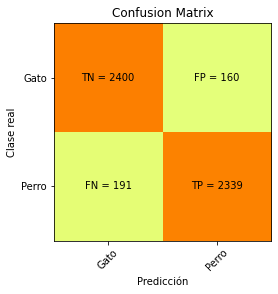

In [ ]:
predictions_label=[(0 if element<0.5 else 1) for element in Y_pred]
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(test_it.labels, predictions_label)
plt.figure(figsize=(4,4))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Wistia)
classNames = ['Gato','Perro']
plt.title('Confusion Matrix')
plt.ylabel('Clase real')
plt.xlabel('Predicción')
tick_marks = np.arange(len(classNames))
plt.xticks(tick_marks, classNames, rotation=45)
plt.yticks(tick_marks, classNames)
s = [['TN','FP'], ['FN', 'TP']]
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]),ha="center", va="center")
        plt.rcParams["axes.grid"] = False
plt.show()

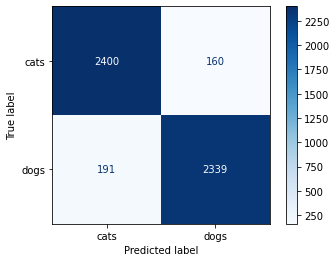

In [ ]:
cm = confusion_matrix(labels_test, predictions_label)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
disp.plot(cmap=plt.cm.Blues)

In [ ]:
print(classification_report(labels_test, predictions_label, target_names=classes))

              precision    recall  f1-score   support

        cats       0.93      0.94      0.93      2560
        dogs       0.94      0.92      0.93      2530

    accuracy                           0.93      5090
   macro avg       0.93      0.93      0.93      5090
weighted avg       0.93      0.93      0.93      5090



In [48]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input, decode_predictions

In [49]:
modelInceptionV3=InceptionV3()
modelInceptionV3.summary()

96112376/96112376 [==============================] - 6s 0us/step
Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 149, 149, 32  864         ['input_7[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 149, 149, 32  96         ['conv2d[0][0]']                 
 alization)           

In [51]:
model = InceptionV3(include_top=False, input_shape=(299, 299, 3))

87910968/87910968 [==============================] - 5s 0us/step


In [52]:
model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_94 (Conv2D)             (None, 149, 149, 32  864         ['input_8[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_94 (BatchN  (None, 149, 149, 32  96         ['conv2d_94[0][0]']              
 ormalization)                  )                                                      

In [50]:
batch_size=16
train_it = datagen.flow_from_directory('/content/data_dogs_vs_cats/train', class_mode='binary', batch_size=batch_size, target_size=(299, 299))
test_it = datagen.flow_from_directory('/content/data_dogs_vs_cats/test', class_mode='binary', batch_size=batch_size, target_size=(299, 299),shuffle=False)

Found 19910 images belonging to 2 classes.
Found 5090 images belonging to 2 classes.


In [57]:
filepath='/content/drive/My Drive/Datos/dogcatsmodels_inception.h5'
checkpoint = ModelCheckpoint(filepath=filepath,
                                monitor='val_loss',
                                verbose=1,
                                save_best_only=True)

In [58]:
model = InceptionV3(include_top=False, input_shape=(299, 299, 3))
for layer in model.layers:
  layer.trainable = False
x = Flatten()(model.output)
x = Dense(128, activation='relu', kernel_initializer='he_uniform')(x)
output = Dense(1, activation='sigmoid')(x)
model = Model(inputs=model.inputs, outputs=output)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [59]:
history = model.fit(train_it, steps_per_epoch=len(train_it),
                              validation_data=test_it, validation_steps=len(test_it),
                              epochs=5, verbose=1, callbacks = [checkpoint])

Epoch 1/5
1245/1245 [==============================] - ETA: 0s - loss: 0.4123 - accuracy: 0.9831
Epoch 1: val_loss improved from inf to 0.02771, saving model to /content/drive/My Drive/Datos/dogcatsmodels_inception.h5
1245/1245 [==============================] - 134s 101ms/step - loss: 0.4123 - accuracy: 0.9831 - val_loss: 0.0277 - val_accuracy: 0.9892
Epoch 2/5
1245/1245 [==============================] - ETA: 0s - loss: 0.0237 - accuracy: 0.9942
Epoch 2: val_loss did not improve from 0.02771
1245/1245 [==============================] - 118s 95ms/step - loss: 0.0237 - accuracy: 0.9942 - val_loss: 0.0299 - val_accuracy: 0.9876
Epoch 3/5
1245/1245 [==============================] - ETA: 0s - loss: 0.0221 - accuracy: 0.9943
Epoch 3: val_loss did not improve from 0.02771
1245/1245 [==============================] - 115s 92ms/step - loss: 0.0221 - accuracy: 0.9943 - val_loss: 0.0327 - val_accuracy: 0.9929
Epoch 4/5
1245/1245 [==============================] - ETA: 0s - loss: 0.0108 - accur

319/319 [==============================] - 24s 72ms/step


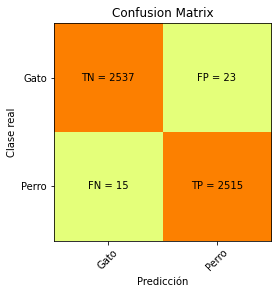

In [ ]:
Y_pred = model.predict(test_it)
predictions_label=[(0 if element<0.5 else 1) for element in Y_pred]
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(test_it.labels, predictions_label)
plt.figure(figsize=(4,4))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Wistia)
classNames = ['Gato','Perro']
plt.title('Confusion Matrix')
plt.ylabel('Clase real')
plt.xlabel('Predicción')
tick_marks = np.arange(len(classNames))
plt.xticks(tick_marks, classNames, rotation=45)
plt.yticks(tick_marks, classNames)
s = [['TN','FP'], ['FN', 'TP']]
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]),ha="center", va="center")
        plt.rcParams["axes.grid"] = False
plt.show()

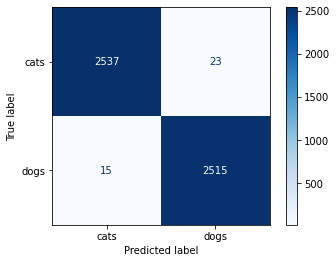

In [ ]:
cm = confusion_matrix(labels_test, predictions_label)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
disp.plot(cmap=plt.cm.Blues)

In [ ]:
print(classification_report(labels_test, predictions_label, target_names=classes))

              precision    recall  f1-score   support

        cats       0.99      0.99      0.99      2560
        dogs       0.99      0.99      0.99      2530

    accuracy                           0.99      5090
   macro avg       0.99      0.99      0.99      5090
weighted avg       0.99      0.99      0.99      5090

